In [0]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [0]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import plotly
from skimage import io
from skimage import morphology as morp
import plotly.express as px
import plotly.graph_objects as go
import math

(512, 512, 3)


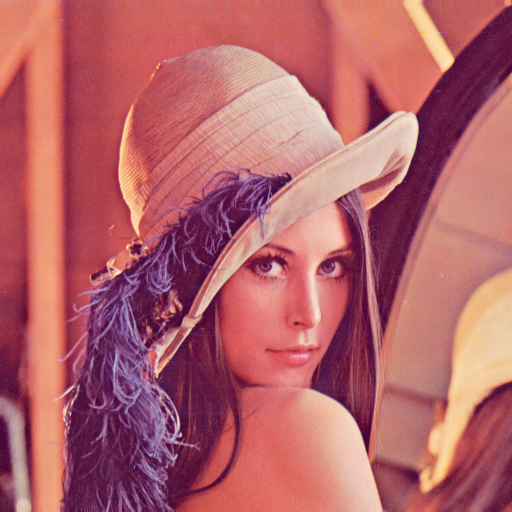

[[[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]]


In [0]:
I = cv2.imread('/content/drive/My Drive/Image Processing/lena.png')
# print(I)
print (I.shape)
cv2_imshow(I)

print (I[0:2][0:1])

(137, 137, 3)


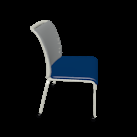

In [0]:
I = cv2.imread('/content/drive/My Drive/Image Processing/chair.png')
print (I.shape)
cv2_imshow(I)

(137, 137, 4)


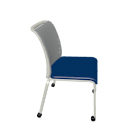

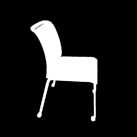

In [0]:
I = cv2.imread('/content/drive/My Drive/Image Processing/chair.png', cv2.IMREAD_UNCHANGED)
print (I.shape)
cv2_imshow(I)
cv2_imshow(I[:,:,3])

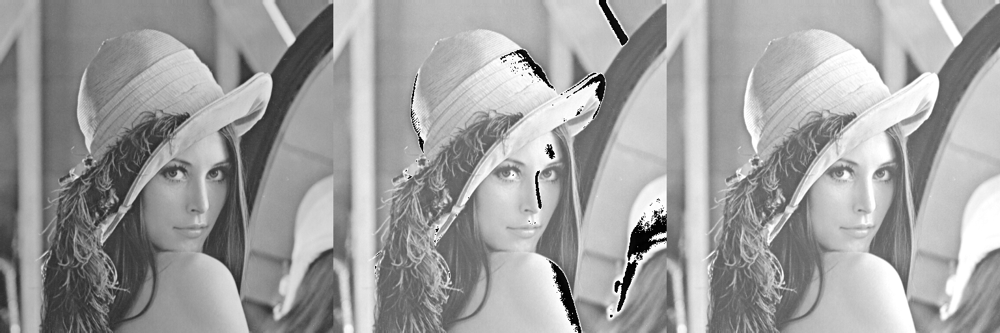

In [0]:
I_lena_bw = cv2.imread('/content/drive/My Drive/Image Processing/lena.png', cv2.IMREAD_GRAYSCALE)

linear_shift = 45
incorrect_transform = I_lena_bw + linear_shift
#need to clip to 255 for correct transform
correct_transform = np.clip((I_lena_bw.astype('int') + linear_shift), 0, 255).astype('uint8')
# print(type(incorrect_transform))
cv2_imshow(np.hstack([I_lena_bw, incorrect_transform, correct_transform]))

Task 3: Perform gamma transformation on the images gamma1.jpg and gamma2.jpg and see which values of gamma give you better images. Use C = 1.

In [0]:
def gamma(I,c,gamma):
  I= I.astype('float')
  I= I / 255
  I= I ** gamma
  return np.clip((I * 255 * c),0,255).astype('uint8')

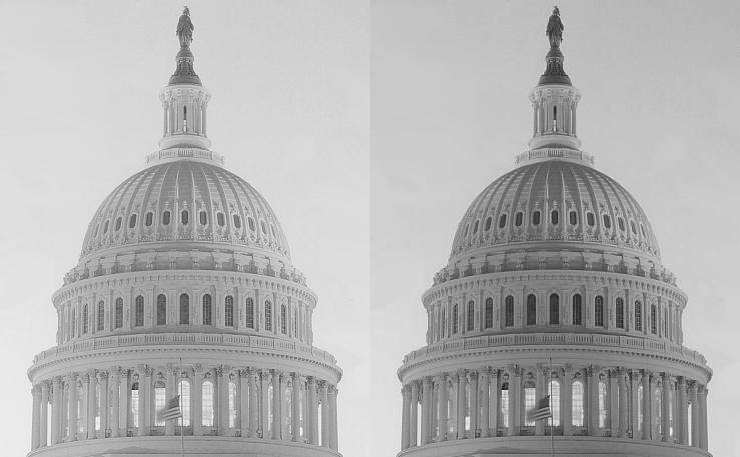

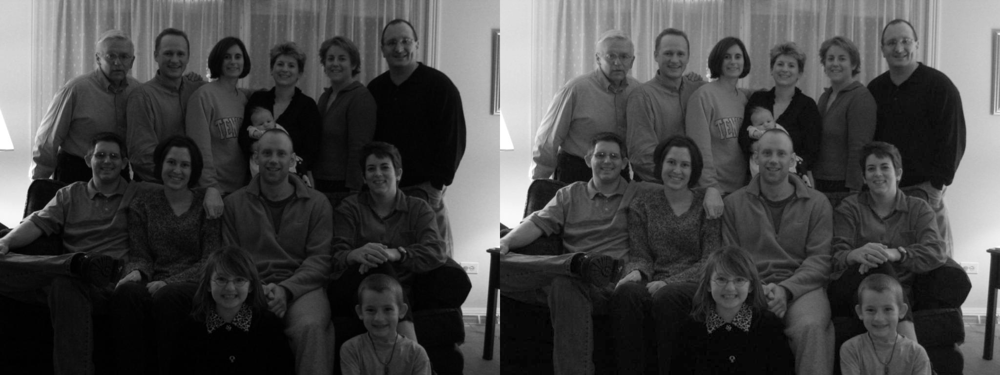

In [0]:
g1 = cv2.imread('/content/drive/My Drive/Image Processing/gamma1.jpg')
g2 = cv2.imread('/content/drive/My Drive/Image Processing/gamma2.jpg')
cv2_imshow(np.hstack([g1,gamma(g1,1,1.5)]))
cv2_imshow(np.hstack([g2,gamma(g2,1,0.7)]))

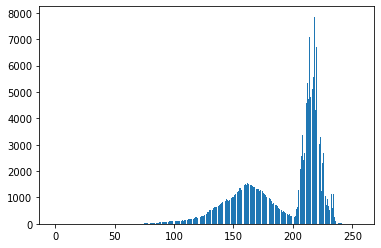

In [0]:
def make_gs_hist(g):
  num_bins = 256
  x = np.zeros(num_bins)
  for i in range(g.shape[0]):
    for j in range(g.shape[1]):
      x[g[i,j]] += 1
  plt.bar([i for i in range(num_bins)],x)

g = cv2.imread('/content/drive/My Drive/Image Processing/gamma1.jpg', cv2.IMREAD_GRAYSCALE)
make_gs_hist(g)

In [0]:
#Plotting colour density

def plotly_colour_density(I):
  fig = go.Figure()
  fig.add_trace(go.Histogram(x=I[:,:,0].ravel(), name= 'Red'))
  fig.add_trace(go.Histogram(x=I[:,:,1].ravel(), name= 'Blue'))
  fig.add_trace(go.Histogram(x=I[:,:,2].ravel(), name= 'Green'))
  fig.show()

lotus = cv2.imread('/content/drive/My Drive/Image Processing/lotus.jpg')
plotly_colour_density(lotus)

In [0]:
#Thresholding Function
def step_func(x):
    return 255 if x >= 105 else 0
vsf = np.vectorize(step_func)

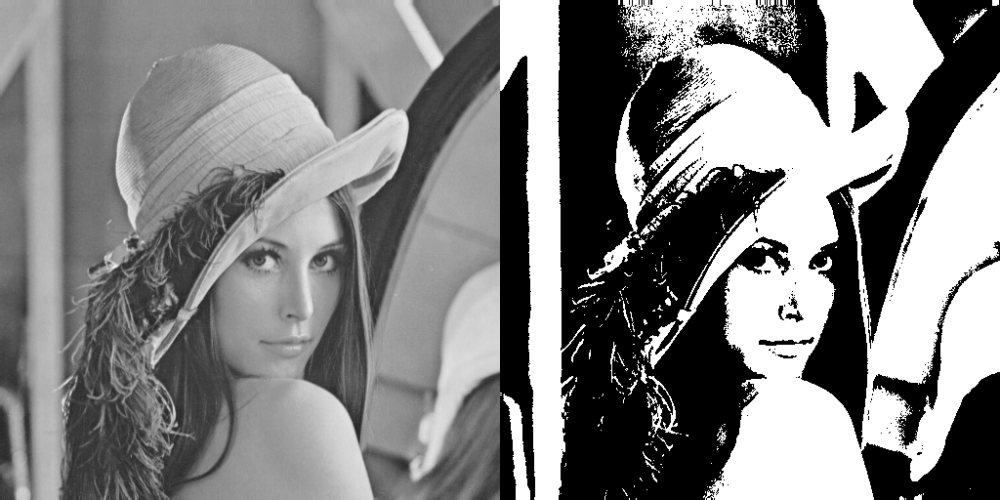

In [0]:
lena = cv2.imread('/content/drive/My Drive/Image Processing/lena.png', cv2.IMREAD_GRAYSCALE)

fig = go.Figure()
fig.add_trace(go.Histogram(x=lena.ravel(), name= "Lena's Pixel Distribution"))
fig.show()

cv2_imshow(np.hstack([lena, vsf(lena)]))

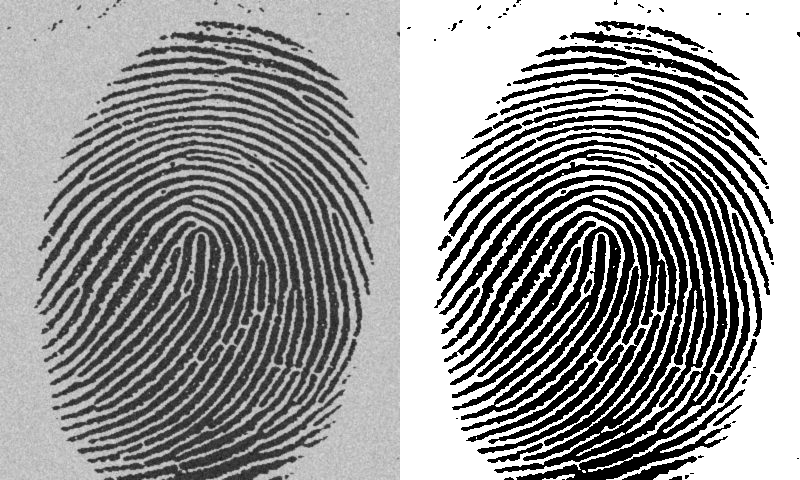

In [0]:
fp = cv2.imread('/content/drive/My Drive/Image Processing/FingerPrint.jpg', cv2.IMREAD_GRAYSCALE)

fig = go.Figure()
fig.add_trace(go.Histogram(x=fp.ravel(), name= "Finger Print's Pixel Distribution"))
fig.show()

cv2_imshow(np.hstack([fp, vsf(fp)]))

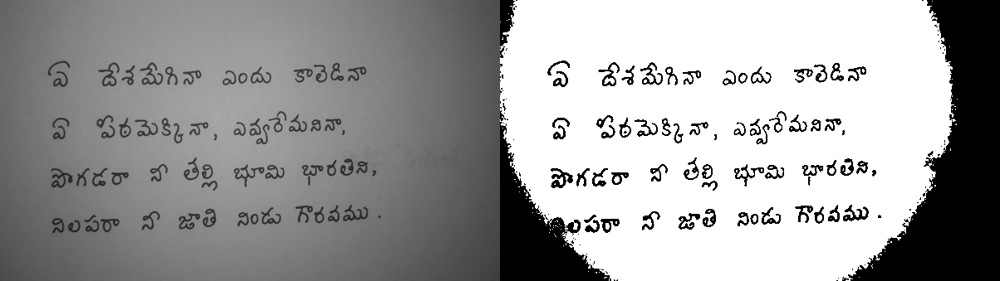

In [0]:
text = cv2.imread('/content/drive/My Drive/Image Processing/text.jpg', cv2.IMREAD_GRAYSCALE)

fig = go.Figure()
fig.add_trace(go.Histogram(x=text.ravel(), name= "Sudoku Pixel Distribution"))
fig.show()

cv2_imshow(np.hstack([text, vsf(text)]))

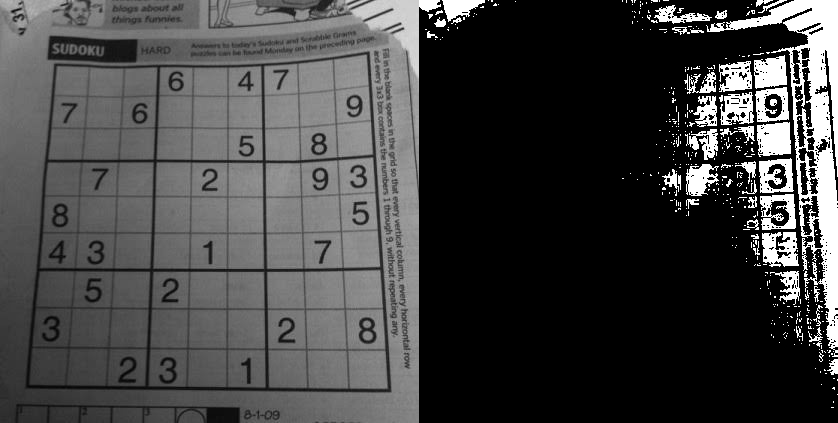

In [0]:
sud = cv2.imread('/content/drive/My Drive/Image Processing/sudoku.jpeg', cv2.IMREAD_GRAYSCALE)

fig = go.Figure()
fig.add_trace(go.Histogram(x=sud.ravel(), name= "Sudoku Pixel Distribution"))
fig.show()

cv2_imshow(np.hstack([sud, vsf(sud)]))

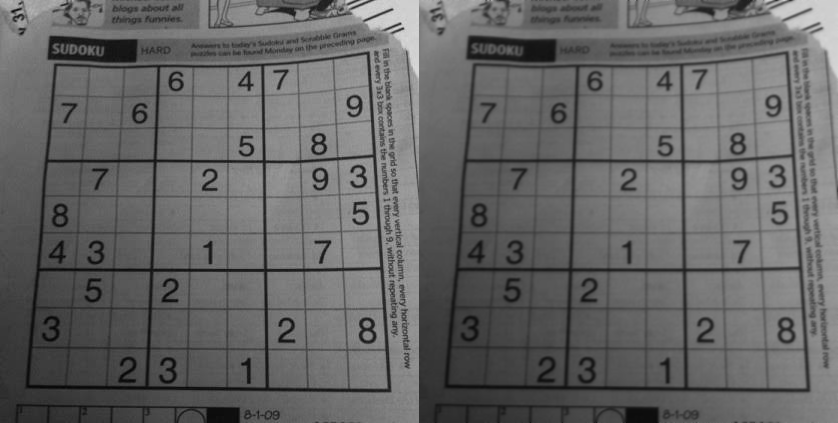

In [0]:
#Using masking and smoothing intead

sud = cv2.imread('/content/drive/My Drive/Image Processing/sudoku.jpeg', cv2.IMREAD_GRAYSCALE)
org = cv2.imread('/content/drive/My Drive/Image Processing/sudoku.jpeg', cv2.IMREAD_GRAYSCALE)
fsud = sud

mask = np.ones((3,3))/9

for i in range(1,sud.shape[0] -1):
  for j in range(1,sud.shape[1] - 1):
    t = 0
    for k in range(-1,2):
      for l in range(-1,2):
        t += sud[i+k,j+l]*mask[1+k,1+l]
    fsud[i,j] = t
cv2_imshow(np.hstack([org,fsud]))

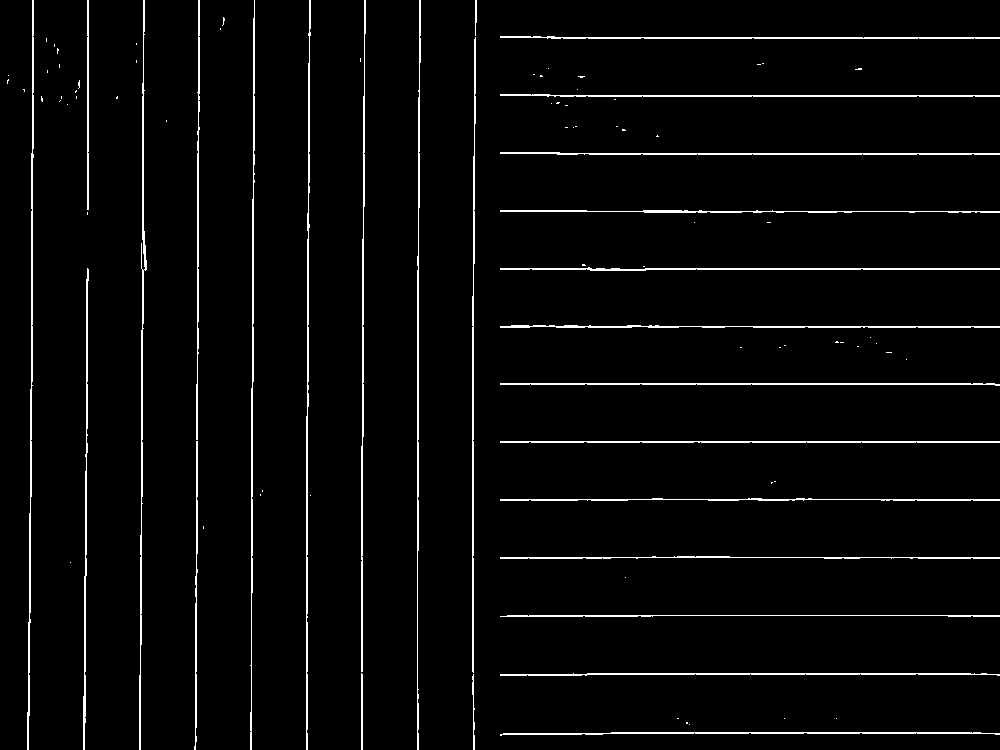

In [0]:
#edge detection

I = cv2.imread('/content/drive/My Drive/Image Processing/window.jpeg', cv2.IMREAD_GRAYSCALE)

sobel_x = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
filtered_image1 = cv2.filter2D(I,-1,sobel_x)

sobel_y = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
filtered_image2 = cv2.filter2D(I,-1,sobel_y)

# magnitude = np.sqrt(np.square(filtered_image1.astype('int')) + np.square(filtered_image2.astype('int')))
# final = np.clip((I + magnitude),0,255).astype('uint8')
# cv2_imshow(np.hstack([I,filtered_image1,filtered_image2]))

def step_func(x):
    return 255 if x >= 140 else 0
vsf = np.vectorize(step_func)

tf1 = vsf(filtered_image1)
tf2 = vsf(filtered_image2)

cv2_imshow(np.hstack([tf1,tf2]))

In [0]:
def count_vertical(I):
  start_altitude = math.floor (I.shape[0] / 2)
  cur = 255
  i = 1
  count = 0
  while( i < I.shape[1]):
    if(I[start_altitude, i] == 0):
      if cur == 255:
        count += 1
        cur = 0
    if I[start_altitude, i] == 255:
      cur = 255
    i+=1
  return count

def count_horizontal(I):
  start_altitude = math.floor (I.shape[1] / 2)
  cur = 255
  i = 1
  count = 0
  while( i < I.shape[0]):
    if(I[i, start_altitude] == 0):
      if cur == 255:
        count += 1
        cur = 0
    if I[i, start_altitude] == 255:
      cur = 255
    i+=1
  return count

count_vertical(tf1), count_horizontal(tf2)


(10, 14)